<a href="https://colab.research.google.com/github/thapaliya123/Coursera_Capstone/blob/master/exploratory_data_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# How To Become Data Scientist  
- Reference: https://medium.com/swlh/a-complete-guide-to-learn-data-science-in-100-days-8c6557154102

In [ ]:
#mount google drive
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [ ]:
#import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import folium
from folium import plugins

mpl.style.use('ggplot') # optional: for ggplot-like style

In [ ]:
#load datasets
PATH = "/content/gdrive/My Drive/IBM_capstone_project/clean_df.csv" #path to the cleaned datasets
collision_df = pd.read_csv(PATH)
collision_df.drop("Unnamed: 0", axis=1, inplace=True)
collision_df.head()

,X,Y,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,LOCATION,SEVERITYCODE,SEVERITYDESC,COLLISIONTYPE,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,INJURIES,SERIOUSINJURIES,FATALITIES,INCDATE,INCDTTM,JUNCTIONTYPE,SDOT_COLCODE,SDOT_COLDESC,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR,INCTIME,INCTIME-BINNED,DAYOFWEEK
0,-122.356511,47.517361,327920,329420,3856094,Matched,Intersection,17TH AVE SW AND SW ROXBURY ST,1,Property Damage Only Collision,Angles,2,0,0,2,0,0,0,2020-01-19,2020-01-19 09:01:00,At Intersection (intersection related),11.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",0.0,Clear,Dry,Daylight,10.0,Entering at angle,0,0,N,09:01:00,Morning,Weekend
1,-122.361405,47.702064,46200,46200,1791736,Matched,Block,HOLMAN RD NW BETWEEN 4TH AVE NW AND 3RD AVE NW,1,Property Damage Only Collision,Rear Ended,2,0,0,2,0,0,0,2005-04-11,2005-04-11 18:31:00,Mid-Block (not related to intersection),14.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END",0.0,Raining,Wet,Dusk,13.0,From same direction - both going straight - bo...,0,0,N,18:31:00,Evening,Begining of week
2,-122.317414,47.664028,1212,1212,3507861,Matched,Block,ROOSEVELT WAY NE BETWEEN NE 47TH ST AND NE 50T...,2,Injury Collision,Head On,2,0,0,2,1,0,0,2013-03-31,2013-03-31 02:09:00,Mid-Block (not related to intersection),11.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",0.0,Clear,Dry,Dark - Street Lights On,30.0,From opposite direction - all others,0,0,N,02:09:00,Early morning,Weekend
3,-122.318234,47.619927,327909,329409,EA03026,Matched,Intersection,11TH AVE E AND E JOHN ST,2,Injury Collision,Pedestrian,3,1,0,1,1,0,0,2020-01-06,2020-01-06 17:55:00,At Intersection (intersection related),24.0,MOTOR VEHCILE STRUCK PEDESTRIAN,0.0,Raining,Wet,Dark - Street Lights On,0.0,Vehicle going straight hits pedestrian,0,0,N,17:55:00,Afternoon,Begining of week
4,-122.351724,47.560306,104900,104900,2671936,Matched,Block,WEST MARGINAL WAY SW BETWEEN SW ALASKA ST AND ...,2,Injury Collision,Other,2,0,0,1,1,0,0,2009-12-25,2009-12-25 19:00:00,Mid-Block (not related to intersection),28.0,MOTOR VEHICLE RAN OFF ROAD - HIT FIXED OBJECT,0.0,Clear,Ice,Dark - Street Lights On,50.0,Fixed object,0,0,N,19:00:00,Evening,End of week


# Pandas Profiling  
- https://medium.com/python-in-plain-english/how-to-use-pandas-profiling-on-google-colab-e34f34ff1c9f   

Now, let's begin data analysis and visualization by taking look at report generated by pandas profiling library

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport

profile = ProfileReport(collision_df, title="Collision Dataset", html={'style': {'full_width': True}})
profile.to_notebook_iframe()

     |████████████████████████████████| 34.6MB 116kB/s 
     |████████████████████████████████| 71kB 2.0MB/s 
     |████████████████████████████████| 71kB 3.8MB/s 
     |████████████████████████████████| 604kB 10.4MB/s 
     |████████████████████████████████| 3.1MB 20.3MB/s 
     |████████████████████████████████| 71kB 8.1MB/s 
     |████████████████████████████████| 296kB 42.1MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-2.9.0-py2.py3-none-any.whl size=258952 sha256=c5c63a607a37eed1d3fbf570ca92436624fb718dc9ad3b2cba7e5ef8f566ad49
  Stored in directory: /tmp/pip-ephem-wheel-cache-c9t3qk10/wheels/56/c2/dd/8d945b0443c35df7d5f62fa9e9ae105a2d8b286302b92e0109
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp36-none-any.whl size=27085 sha256=d435a7336690328955c02e8422508cbb412fab5414cb927141a743ae5421c9e2
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
  Created wheel for imagehash: filename=ImageHash-4.

From above report, we can conclude that, 
- there are no missing values in datasets. 
- Also some variable are highly correlated with other variable.  
  - INCKEY is highly correlated with COLDETKEY   
  - SEVERITYDESC is highly correlated with SEVERITYCODE  
  - COLLISIONTYPE is highly correlated with ST_COLDESC  


#Boilerplate  
let's define some boilerplate that will be used repeatedly during visualization process

In [ ]:
#Annotates Vertical Bar Chart with their respective value, Will be used Later in several visualization

def annotate_vertical_bar_chart(axis, fontsize=11, color='black', width_text_adjust = 0.005, height_text_adjust = 0.8):
    '''
    Annotate Vertical bar chart plotted with the respective value on top of each bar
    
    Arguments:
    axis: axis of the chart 
    fontsize: size of the font to be annotated on the top of bar, default fontsize=11
    color: color of the annnotated text, default color='black'
    '''
    totals = []
    for i in ax.patches:   
        totals.append(i.get_height())

    total = sum(totals)
    for  i in ax.patches:
        ax.text(i.get_x()-width_text_adjust, i.get_height()+height_text_adjust,\
               str(round(float(i.get_height()), 1)), fontsize=fontsize, color=color)

In [ ]:
#Annotates Horizontal Bar Chart with their respective value, Will be used for later visualization
def annotate_horizontal_bar_charts(axis, fontsize=11, color='black', width_text_adjust = 0.1, height_text_adjust=0.2):
    '''
    Annotate Horizontal bar chart plotted, with the respective value on top of each bar
    
    Arguments:
    axis: axis of the chart
    fontsize: size of the font to be annotated on the top of bar, default fontsize=11
    color: color of the annotated text, default color='black'
    
    '''
    totals = []
    for i in ax.patches:
        totals.append(i.get_width())

    # set individual bar lables using above list
    total = sum(totals)

    # set individual bar lables using above list
    for i in ax.patches:
        # get_width pulls left or right; get_y pushes up or down
        ax.text(i.get_width()+width_text_adjust, i.get_y()+height_text_adjust, \
                str(round((i.get_width()), 2)), fontsize=fontsize, color=color)

In [ ]:
#set title, xlabel, ylabel
def set_title_xlabel_ylabel(title_name, xlabel_name='', ylabel_name='', axis = plt, font_title=14, font_x = 14, font_y = 14):
    '''
    Set title, xlabel, ylabel to the figure
    
    Arguments:
    title_name: name of the title of the figure
    xlabel: xlabel name of the figure
    ylabel: ylabel name of the figure
    axis: axis of the figure, default = 'plt', if artist layer is used, then pass the axis
    font_title: font size of the title
    font_x: font size of the xlabel
    font_y: font size of the ylabel
    '''
    if axis == plt:
        axis.title(title_name, fontsize = font_title)
        axis.xlabel(xlabel_name, fontsize = font_x)
        axis.ylabel(ylabel_name, fontsize = font_y)
        
    else:
        axis.set_title(title_name, fontsize = font_title)
        axis.set_xlabel(xlabel_name, fontsize = font_x)
        axis.set_ylabel(ylabel_name, fontsize = font_y)
    

In [ ]:
#removes axis line
def remove_axis_line(axis_, axis_lines):
    '''
    Removes axis line depending on passed argument
    
    Arguments:
    axis_: Axis of figure whose axis line to be removed
    axis_lines: List containing axis lines to be deleted, e.g. axis_lines='top', 'left', 'right', 'bottom'
    '''
    for axis in axis_lines:
        axis_.spines[axis].set_visible(False)

In [ ]:
#allocate colors to bar, bar with similar value will have similar colors
def allocate_color_to_bars(unique_series_items, color_list):
    '''
    - Allocate colors to bar in bar chart, bar with similar value will be assign a similar color
    - Works only with single column in dataframe
    
    Arguments:
    unique_series_items: list containing unique items in series of dataframe which needs to be plotted
    color_list: list of colors which is assign to individual value in 'unique_series_items'
    Returns:
    colors: a dictionary containing color assigns to unique value in the series of dataframe
    '''
    
    #set color for each unique bars
    colors = {}
    for item, color in zip(unique_series_items, color_list):
        colors[item] = color
    return colors

In [ ]:
def remove_xticks_yticks():
    '''
    Removes xticks yticks of the figure created using matplotlib
    '''
    plt.tick_params(
    axis='both',          # changes apply to the x-axis
    which='both',         # both major and minor ticks are affected
    bottom=False,         # ticks along the bottom edge are off
    left=False)

In [ ]:
#removes legend
def remove_legend():
    '''
    Removes legends present in the chart plotted using matplotlib
    
    '''
    leg = plt.legend()
    leg.remove()

In [ ]:
def plot_pie_chart(dataframe, column_name, colors_list=[], explode_list=[], title_name='', piechart_title_dist=20, legend_loc='upper left'):
  '''
  plots piechart for a column values in a given dataframe

  Arguments:
  dataframe: pandas dataframe
  column_name: name of columns from dataframe whose value is to be plotted, datatype must be integer or float
  colors_list: list of color for piechart, default = []
  explode_list: list that contains value, which denotes wedges of piechart that need be explode, default = []
  title_name: name of piechart, default = empty string
  piechart_title_dist: distance between piechart and titlename, default = 20
  legend_loc: location where legend needs to be placed, default = 'upper left'
  '''
  colors_list = colors_list
  explode_list = explode_list
  dataframe[column_name].plot(kind='pie',
                                    figsize=(10, 6),
                                    autopct = '%1.1f%%', #add in percentage
                                    startangle = 90, #start angle 90°
                                    shadow = True, #add shadow
                                    labels = None, #turn off labels in the pie chart
                                    pctdistance = 1.12, #the ratio between the center of each pie slice and the start of the text generated by autopct
                                    colors = colors_list, #add custom color
                                    explode = explode_list, #explode lowest severity cases
                                    )  

  #set title 
  plt.title("proportion of severity due to collision")

  #set distance between piechart and title
  rcParams['axes.titlepad'] = 20 

  plt.axis('equal') #sets the pie chart to look like a circle.

  plt.legend(labels=dataframe.index, loc='upper left') #add legends which implies labels in pie chart

  plt.show() #show chart

#Now, Let's begin our analysis by plotting   

Q. **Can we visualize collision occured using seattle map?**  
  

In [ ]:
#locating collision on the seattle map
seattle_latitude = 47.608013 #seattle latitude
seattle_longitude = -122.335167 #seattle longitude

seattle_map = folium.Map(location=[seattle_latitude, seattle_longitude], zoom_start=8)

#instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(seattle_map)

#add pop-up text to each marker on the map
latitudes = list(collision_df["Y"].head(1000))
longitudes = list(collision_df["X"].head(1000)) 
labels = list(collision_df["SEVERITYDESC"].head(1000))
collision_time = list(collision_df["INCTIME-BINNED"])
for lat, lng, label, time in zip(latitudes, longitudes, labels, collision_time):
  folium.Marker(
      location=[lat, lng],
      icon=None,
      popup="severity_description:\n{}\ntime_of_collision:{}".format(label, time),
  ).add_to(incidents)
seattle_map

Cool, right?  
By zooming in or out in map, we can see collision that took place on particular location, also we can hover on the particular marker to see **severity description** and **time of collision**

**Q. In which Addess Type Collisions occured most?**  

Different collision address types are  
1. Alley:  
  - Refer to narrow, usually paved, pedestrain_path, often between walls of buildings in towns and cities  
  - Often used by slow moving vehicles, especially designed and friendly for pedestrain   

2. Intersection:  
  - Intersection is an at-grade junction where two or more roads or streets meets or cross  

3. Block




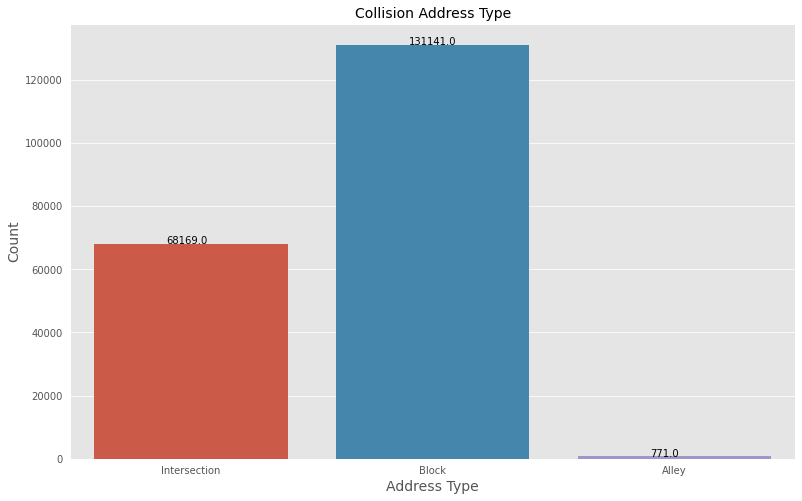

In [ ]:
#define figure size
figure = plt.figure(figsize=(13, 8))

# ax = sns.countplot(collision_df["ADDRTYPE"], hue=collision_df["DAYOFWEEK"])
ax = sns.countplot(x="ADDRTYPE", data=collision_df)

#set title, xlabel and ylabel
title_name = "Collision Address Type"
xlabel = "Address Type"
ylabel = "Count"
set_title_xlabel_ylabel(title_name, xlabel, ylabel)

#annotate chart
for p in ax.patches:
  ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.3, p.get_height()))

#remove tick marks from x and y axis
remove_xticks_yticks()

#show chart
plt.show()

From above chart, we can conclude that: 
- least collision occur in **Alley** which is especially designed for pedestrain  
- most collision occur in **Block** adress type

**Q. What proportion of total collisions corresponds to *property damage*, *Injury*, *Serious Injury*, *Fatality*?** 

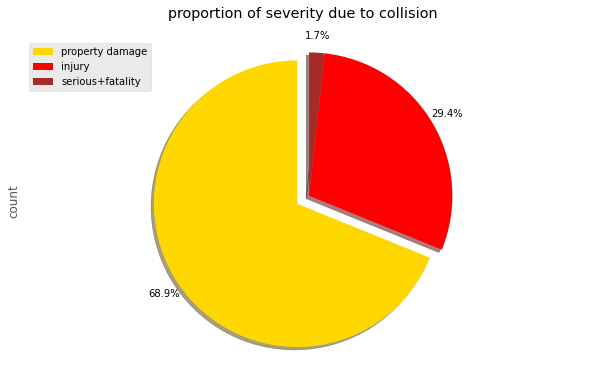

In [ ]:
from matplotlib import rcParams

#count each severity code, assign counted number and severity code name to new dataframe named "severity_code"
severity_code = collision_df['SEVERITYCODE'].value_counts()
severity_code = pd.DataFrame(severity_code)
severity_code.reset_index(inplace=True)

#replace severity code values to actual meaning
replace_values = ['1', '2', '2b', '3']
desired_values = ['property damage', 'injury', 'serious injury', 'fatality']
severity_code.replace(to_replace=replace_values, value=desired_values, inplace=True)
severity_code.set_index('index', inplace=True)

#rename column name from "SEVERITYCODE" -> "count"  of dataframe named "severity_code" 
severity_code.columns = ['count']


#sum "serious injury  + fatality" severity code values
severity_code_serious_plus_fatality = pd.DataFrame({'count':[severity_code.iloc[2, 0]+severity_code.iloc[3, 0]]})
severity_code_serious_plus_fatality.rename(index={0:'serious+fatality'}, inplace=True)

#assign severity code values without "serious injury" and "fatality"
severity_code_without_serious_fatality = severity_code[0:2]

#concat above two dataframe, final dataframe contains SEVERITY CODE i.e ["property damage", "injury", "serious+fatality"]
severityCode_sum_seriousFatality = pd.concat([severity_code_without_serious_fatality, severity_code_serious_plus_fatality])

# #plotting
colors_list = ['gold', 'red', 'brown']
explode_list = [0.1, 0, 0]
title_name = 'proportion of severity due to collision'

plot_pie_chart(severityCode_sum_seriousFatality, 'count', colors_list, explode_list, title_name)

From above we can conclude that highest proportion of total collision corresponds to **Only property damage** i.e  
1. Only property damage = 68.9%  
2. Injury = 29.4%  
3. Serious Injury + fatality = 1.7%  

This shows that most collision results only property damage with the proportion of 68.9%


**Q.Was the collision more severe when driver is under the influence of drugs or alcohol consumption compared to that of no drugs or alcohol consumption?**

/usr/local/lib/python3.6/dist-packages/seaborn/axisgrid.py:645: UserWarning: Using the countplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


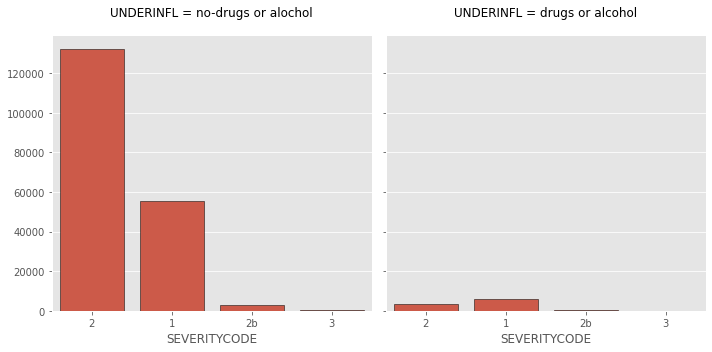

In [ ]:
#copy dataframe
collision_df_copy = collision_df.copy()

#replace values in UNDERINFL field from [0.0, 1.0] -> ["no-drugs or alcohol", "drugs or alcohol"]
collision_df_copy.replace([0.0, 1.0], ["no-drugs or alochol", "drugs or alcohol"], inplace=True)

#make grid based on unique value in the variable "UNDERINFL" i.e 2 grid, one for 0.0, and next for 1.0
g = sns.FacetGrid(collision_df_copy, col="UNDERINFL", palette="Set1", height = 5, col_wrap=2)

#Count SEVERITYCODE for each case i.e 0.0 and 1.0
g.map(sns.countplot, "SEVERITYCODE", ec='k')

In above figure,
- 1 -> "Only Property damage"  
- 2 -> "Injury"  
- 2b -> "Serious injury"  
- 3 -> "Fatality"  

From above chart we can see that,  
- In both cases fatality due to collision tends to zero i.e 259 and 93.   
- If the driver was not under the influence of drugs/alcohol, 
  - _injury_ due to collision is extremely high i.e around 1,25000 followed by _property damage_, _serious injury_, _fatality_   
- If the driver was under the influence of drugs/alcohol,   
  - _property damage_ due to collision is higher than _injury_, _serious injury_, _fatality_    

**Q. What sort of weather condition leads to more collision?**

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:4384: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:1783: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item_labels[indexer[info_axis]]] = value


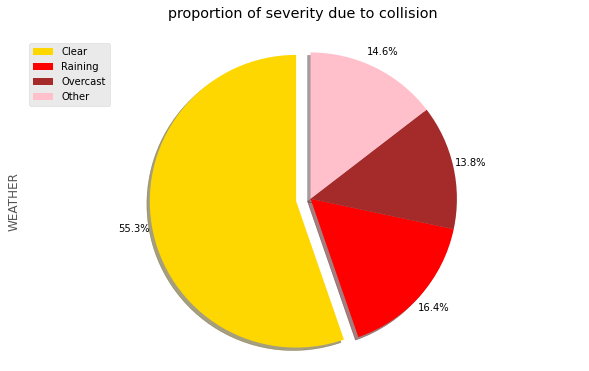

In [ ]:
#preparing dataframe

#unique value cout in column "WEATHER"
weather_category = collision_df["WEATHER"].value_counts().to_frame()

#get first four value
weather_category_first_four = weather_category.head(4)

#replace 1028 with nan values
weather_category_first_four.replace(1028, np.nan, inplace=True)

#redefine index value of dataframe
weather_category_first_four.index = ["Clear", "Raining", "Overcast", "Other"]

#get last 8 values and sum it
weather_other_count = weather_category.tail(8).sum()

#replace nan values from dataframe "weather_category_first_four" with obtained sum values i.e "weather_other_count"
weather_category_first_four.replace(np.nan, weather_other_count, inplace=True)

#plotting
colors_list = ['gold', 'red', 'brown', 'pink']
explode_list = [0.1, 0, 0, 0]
title_name = ''
plot_pie_chart(weather_category_first_four, 'WEATHER', colors_list, explode_list, title_name)

- In the above chart Other wedges from piechart compose of following weather condition i.e  
  - **Snowing**, **Fog_Smog_Smoke**, **Sleet_Hail_Freezing Rain**, **Blowing Sand_Dirt**, **severe_crosswing**, partly_cloudy, **blowing_snow** 

- From above chart we can conclude that **More Collision** took place when **weather condition** is **Clear** (55.3%) followed by **Raining** (16.4%) followed by **Overcast** (13.8%)

- Also out of total collision, 14.6% of collision resulted due to Other Weather Condition which is described above. 

**Q. How severe is the collision based on type of collision?**

/usr/local/lib/python3.6/dist-packages/seaborn/axisgrid.py:645: UserWarning: Using the countplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


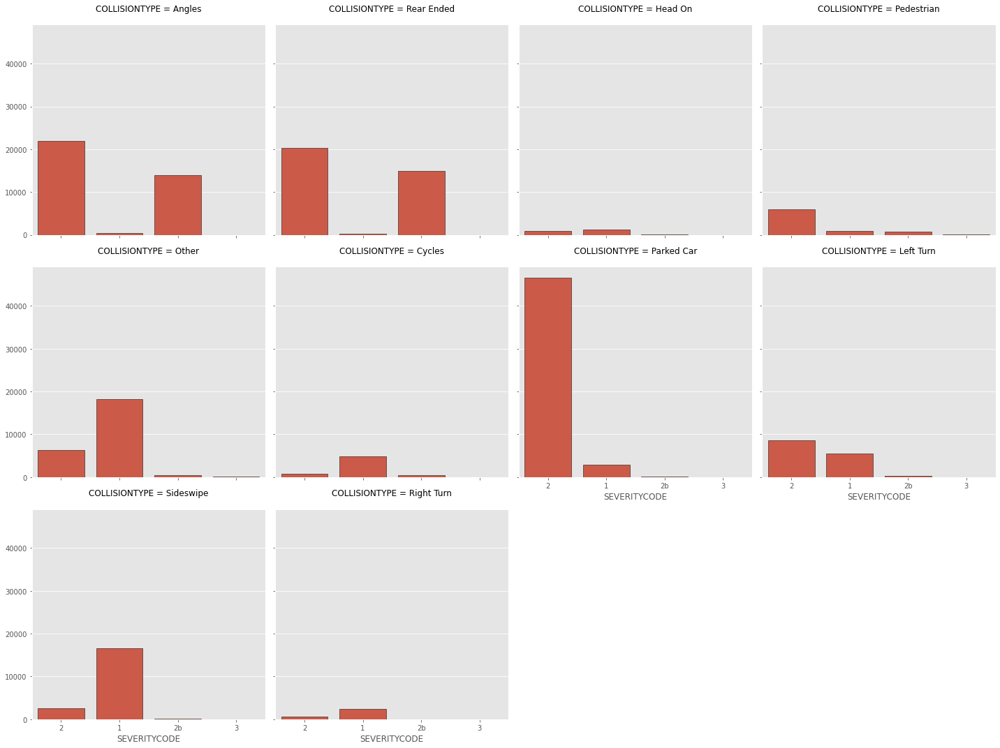

In [ ]:
#make grid based on unique value in the variable "COLLISIONTYPE"
g = sns.FacetGrid(collision_df, col="COLLISIONTYPE", palette="Set1", height = 5, col_wrap=4)

#Count "SEVERITYCODE" for each unique cases in "COLLISIONTYPE"
g.map(sns.countplot, "SEVERITYCODE", ec='k')

- Road Collision Types:  
  - **References**: https://en.wikipedia.org/wiki/Road_collision_types
  - Lane departure crashes, which occur when a driver leaves the lane they are in and collide with another vehicle or a roadside object. Includes **head-on collisions** 
  - collisions at junctions include **rear-end collision**, **Angles Collision**, **Sideswipe Collisions**   
  - Collisions involving **pedestrians** and **cyclists**  
  - Collisions involving **animals**

- From above plots we can conclude that:  
  1. **Angles Collision**: most collision leads to **Injury** and **Serious   Injury**    
  2. **Rear Ended Collision**: most collision leads to **Injury** and **Serious Injury**  
  3. **Head On Collision**: There are few collision which falls under this category. Most of the collision leads to **Only property Damage**  
  4. **Pedestrian Collision**: most collision leads to **Injury**  
  5. **Other**: most collision leads to **Only Property Damage**  
  6. **Cycles**: most collision leads to **Only Property Damage**  
  7. **Parked Car**: most collision leads to **Injury**  
  8. **Left Turn**: most collision leads to **Injury** followed by **Only Property Damage**  
  9. **Right Turn**: most collision leads to **Only Property Damage** followed by **Injury**    
  10.**Sideswipe**: most collision leads to **Only Property Damage** followed  by **Injury**  

- We can conclude that, **fatality** due to collision is very low in count compared to other three categories.

# Seaborn Visualization   
- Reference: https://medium.com/edureka/python-seaborn-tutorial-646fdddff322

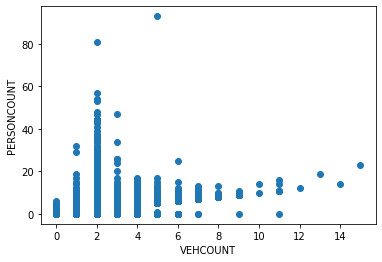

In [ ]:
ax = plt.scatter(collision_df['VEHCOUNT'], collision_df['PERSONCOUNT'])
plt.xlabel('VEHCOUNT')
plt.ylabel('PERSONCOUNT')
plt.show()